### Download Images


In [1]:
import os
img_dir = '/tmp/nst'
if not os.path.exists(img_dir):
    os.makedirs(img_dir)
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/9/91/Panthera_tigris_at_tuzoofari_mexico2018.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/4/4f/Ooty_lake_2.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg
!wget --quiet -P /tmp/nst/ https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg

### Import and configure modules


In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams["figure.figsize"] = (10, 10)
mpl.rcParams["axes.grid"] = False

import numpy as np
from PIL import Image
import time
import functools

In [3]:
%tensorflow_version 2.x
import tensorflow as tf

from tensorflow.keras.utils import image_dataset_from_directory as kp_image
from tensorflow.keras.utils import img_to_array
from tensorflow.python.keras import models
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [4]:
# Set up some global values here
content_path = f"{img_dir}/Panthera_tigris_at_tuzoofari_mexico2018.jpg"
style_path = f"{img_dir}/The_Great_Wave_off_Kanagawa.jpg"

# print(content_path, style_path)

## Visualize the input


In [5]:
def load_img(path_to_img):
    max_dim = 512
    img = Image.open(path_to_img)
    long = max(img.size)
    scale = max_dim / long
    img = img.resize(
        (round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS
    )

    img = img_to_array(img)

    # We need to broadcast the image array such that it has a batch dimension
    img = np.expand_dims(img, axis=0)
    return img

In [6]:
def imshow(img, title=None):
    # Remove the batch dimension
    out = np.squeeze(img, axis=0)
    # Normalize for display
    out = out.astype("uint8")
    plt.imshow(out)
    if title is not None:
        plt.title(title)
    plt.imshow(out)

These are input content and style images.


<ipython-input-5-efe26995a723>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


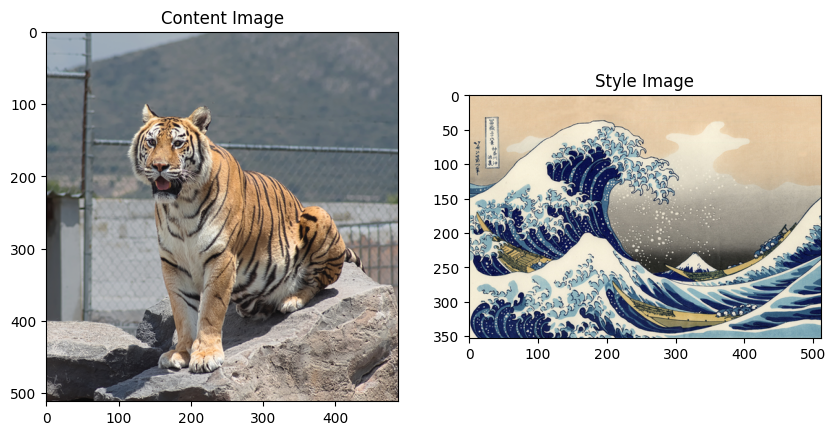

In [7]:
plt.figure(figsize=(10, 10))

content = load_img(content_path).astype("uint8")
style = load_img(style_path).astype("uint8")

plt.subplot(1, 2, 1)
imshow(content, "Content Image")

plt.subplot(1, 2, 2)
imshow(style, "Style Image")
plt.show()

## Prepare the data

I'd like to develop methods that make it easy for me to load and preprocess my images. The preprocessing follows the VGG training process, where each channel in the images is normalized using the mean values of [103.939, 116.779, 123.68], and the channels are represented in BGR.


In [8]:
def load_and_process_img(path_to_img):
    img = load_img(path_to_img)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

To examine the outcomes of my optimization, I have to carry out the reverse preprocessing step. Moreover, since the optimized image values can vary from negative to positive infinity, it's crucial to clip them to keep the values within the 0-255 range.


In [9]:
def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    assert len(x.shape) == 3, (
        "Input to deprocess image must be an image of "
        "dimension [1, height, width, channel] or [height, width, channel]"
    )
    if len(x.shape) != 3:
        raise ValueError("Invalid input to deprocessing image")

    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]

    x = np.clip(x, 0, 255).astype("uint8")
    return x

### Define content and style representations

In order to get both the content and style representations of our image, we will look at some intermediate layers within our model. As we go deeper into the model, these intermediate layers represent higher and higher order features. In this case, we are using the network architecture VGG19, a pretrained image classification network. These intermediate layers are necessary to define the representation of content and style from our images. For an input image, we will try to match the corresponding style and content target representations at these intermediate layers.


In [10]:
# Content layer where will pull our feature maps
content_layers = ["block5_conv2"]

# Style layer we are interested in
style_layers = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

## Build the Model

In this scenario, I load VGG19 and input our tensor into the model. This enables me to extract the feature maps, and consequently, the content and style representations of the content, style, and generated images.


To access the intermediate layers that correspond to the style and content feature maps, I retrieve the respective outputs and employ the Keras Functional API. Using this approach, I define my model with the desired output activations. In the Functional API, defining a model is a matter of specifying the input and output
`model = Model(inputs, outputs)`


In [11]:
def get_model():
    """I will create a model with access to intermediate layers. In this function, I'll load the VGG19 model and access its intermediate layers. Subsequently, I'll use these layers
    to build a new model capable of taking input images and producing outputs from these intermediate layers of the VGG model.
    Upon completion, the function will return a Keras model designed to accept image inputs and provide outputs representing the style and content intermediate layers
    """
    # Load my model. I am  loading pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights="imagenet")
    vgg.trainable = False
    # Get output layers corresponding to style and content layers
    style_outputs = [vgg.get_layer(name).output for name in style_layers]
    content_outputs = [vgg.get_layer(name).output for name in content_layers]
    model_outputs = style_outputs + content_outputs
    # Build model
    return models.Model(vgg.input, model_outputs)

## Define and create our loss functions (content and style distances)


### Content Loss


### Computing content loss

We will actually add our content losses at each desired layer. This way, each iteration when we feed our input image through the model (which in eager is simply `model(input_image)`!) all the content losses through the model will be properly compute and because we are executing eagerly, all the gradients will be computed.


In [12]:
def get_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

## Style Loss


### Computing style loss

Again, we implement our loss as a distance metric .


In [13]:
def gram_matrix(input_tensor):
    # We make the image channels first
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)


def get_style_loss(base_style, gram_target):
    """Expects two images of dimension h, w, c"""
    # height, width, num filters of each layer
    # We scale the loss at a given layer by the size of the feature map and the number of filters
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)

    return tf.reduce_mean(
        tf.square(gram_style - gram_target)
    )  # / (4. * (channels ** 2) * (width * height) ** 2)

## Apply style transfer to our images


### Run Gradient Descent


I will define a helper function to load my content and style images, pass them through the network, and obtain the content and style feature representations from my model.


In [14]:
def get_feature_representations(model, content_path, style_path):
   """Function to compute content and style feature representations:
    This function loads and preprocesses the content and style images from their specified paths. Subsequently, it passes them through the network, obtaining the outputs of the
    intermediate layers.

Parameters:
model: The utilized model.
content_path: The path leading to the content image.
style_path: The path leading to the style image.

Output:
The function returns the style features and content features.
  """
  # Load my images in
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)

  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)


  # Get the style and content feature representations from my model
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

### Computing the loss and gradients


In [15]:
def compute_loss(
    model, loss_weights, init_image, gram_style_features, content_features
):
    """This function will compute the loss total loss.

    Arguments:
      model: The model that will give us access to the intermediate layers
      loss_weights: The weights of each contribution of each loss function.
        (style weight, content weight, and total variation weight)
      init_image: Our initial base image. This image is what we are updating with
        our optimization process. We apply the gradients wrt the loss we are
        calculating to this image.
      gram_style_features: Precomputed gram matrices corresponding to the
        defined style layers of interest.
      content_features: Precomputed outputs from defined content layers of
        interest.

    Returns:
      returns the total loss, style loss, content loss, and total variational loss
    """
    style_weight, content_weight = loss_weights

    # Feed our init image through our model. This will give us the content and
    # style representations at our desired layers. Since we're using eager
    # our model is callable just like any other function!
    model_outputs = model(init_image)

    style_output_features = model_outputs[:num_style_layers]
    content_output_features = model_outputs[num_style_layers:]

    style_score = 0
    content_score = 0

    # Accumulate style losses from all layers
    # Here, we equally weight each contribution of each loss layer
    weight_per_style_layer = 1.0 / float(num_style_layers)
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * get_style_loss(
            comb_style[0], target_style
        )

    # Accumulate content losses from all layers
    weight_per_content_layer = 1.0 / float(num_content_layers)
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer * get_content_loss(
            comb_content[0], target_content
        )

    style_score *= style_weight
    content_score *= content_weight

    # Get total loss
    loss = style_score + content_score
    return loss, style_score, content_score

Then computing the gradients is easy:


In [16]:
def compute_grads(cfg):
    with tf.GradientTape() as tape:
        all_loss = compute_loss(**cfg)
    # Compute gradients wrt input image
    total_loss = all_loss[0]
    return tape.gradient(total_loss, cfg["init_image"]), all_loss

### Optimization loop


In [17]:
import IPython.display


def run_style_transfer(
    content_path, style_path, num_iterations=1000, content_weight=1e3, style_weight=1e-2
):
    # We don't need to (or want to) train any layers of our model, so we set their
    # trainable to false.
    model = get_model()
    for layer in model.layers:
        layer.trainable = False

    # Get the style and content feature representations (from our specified intermediate layers)
    style_features, content_features = get_feature_representations(
        model, content_path, style_path
    )
    gram_style_features = [
        gram_matrix(style_feature) for style_feature in style_features
    ]

    # Set initial image
    init_image = load_and_process_img(content_path)
    init_image = tf.Variable(init_image, dtype=tf.float32)
    # Create our optimizer
    opt = tf.optimizers.Adam(learning_rate=5, epsilon=1e-1)

    # For displaying intermediate images
    iter_count = 1

    # Store our best result
    best_loss, best_img = float("inf"), None

    # Create a nice config
    loss_weights = (style_weight, content_weight)
    cfg = {
        "model": model,
        "loss_weights": loss_weights,
        "init_image": init_image,
        "gram_style_features": gram_style_features,
        "content_features": content_features,
    }

    # For displaying
    num_rows = 2
    num_cols = 5
    display_interval = num_iterations / (num_rows * num_cols)
    start_time = time.time()
    global_start = time.time()

    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means

    imgs = []
    for i in range(num_iterations):
        grads, all_loss = compute_grads(cfg)
        loss, style_score, content_score = all_loss
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, min_vals, max_vals)
        init_image.assign(clipped)
        end_time = time.time()

        if loss < best_loss:
            # Update best loss and best image from total loss.
            best_loss = loss
            best_img = deprocess_img(init_image.numpy())

        if i % display_interval == 0:
            start_time = time.time()

            # Use the .numpy() method to get the concrete numpy array
            plot_img = init_image.numpy()
            plot_img = deprocess_img(plot_img)
            imgs.append(plot_img)
            IPython.display.clear_output(wait=True)
            IPython.display.display_png(Image.fromarray(plot_img))
            print("Iteration: {}".format(i))
            print(
                "Total loss: {:.4e}, "
                "style loss: {:.4e}, "
                "content loss: {:.4e}, "
                "time: {:.4f}s".format(
                    loss, style_score, content_score, time.time() - start_time
                )
            )
    print("Total time: {:.4f}s".format(time.time() - global_start))
    IPython.display.clear_output(wait=True)
    plt.figure(figsize=(14, 4))
    for i, img in enumerate(imgs):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])

    return best_img, best_loss

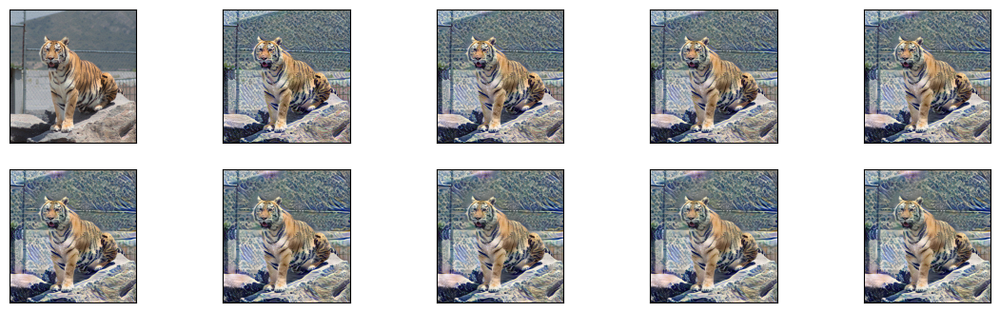

In [18]:
best, best_loss = run_style_transfer(content_path, style_path, num_iterations=1000)

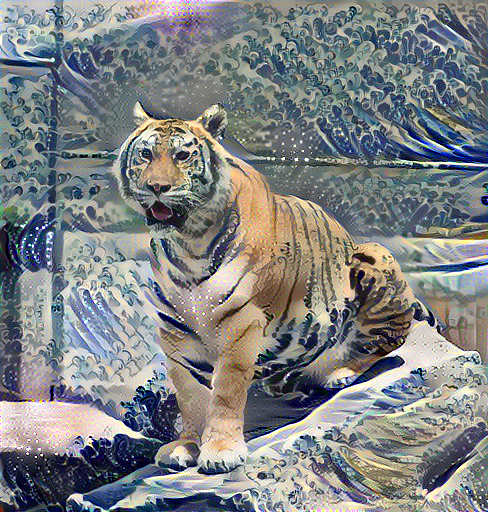

In [19]:
Image.fromarray(best)

To download the image from Colab uncomment the following code:


In [20]:
# from google.colab import files
# final_img = Image.fromarray(best)
# final_img.save('wave_turtle.png')
# files.download('wave_turtle.png')

## Visualize outputs

We "deprocess" the output image in order to remove the processing that was applied to it.


In [21]:
def show_results(best_img, content_path, style_path, show_large_final=True):
    plt.figure(figsize=(10, 5))
    content = load_img(content_path)
    style = load_img(style_path)

    plt.subplot(1, 2, 1)
    imshow(content, "Content Image")

    plt.subplot(1, 2, 2)
    imshow(style, "Style Image")

    if show_large_final:
        plt.figure(figsize=(10, 10))

        plt.imshow(best_img)
        plt.title("Output Image")
        plt.show()

<ipython-input-5-efe26995a723>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


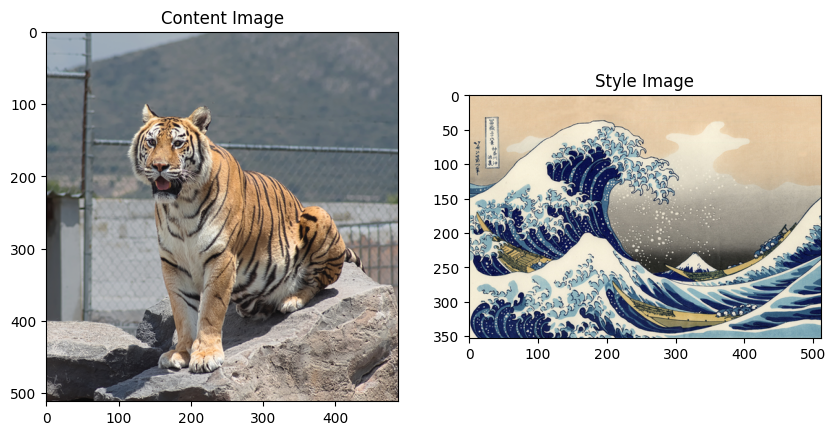

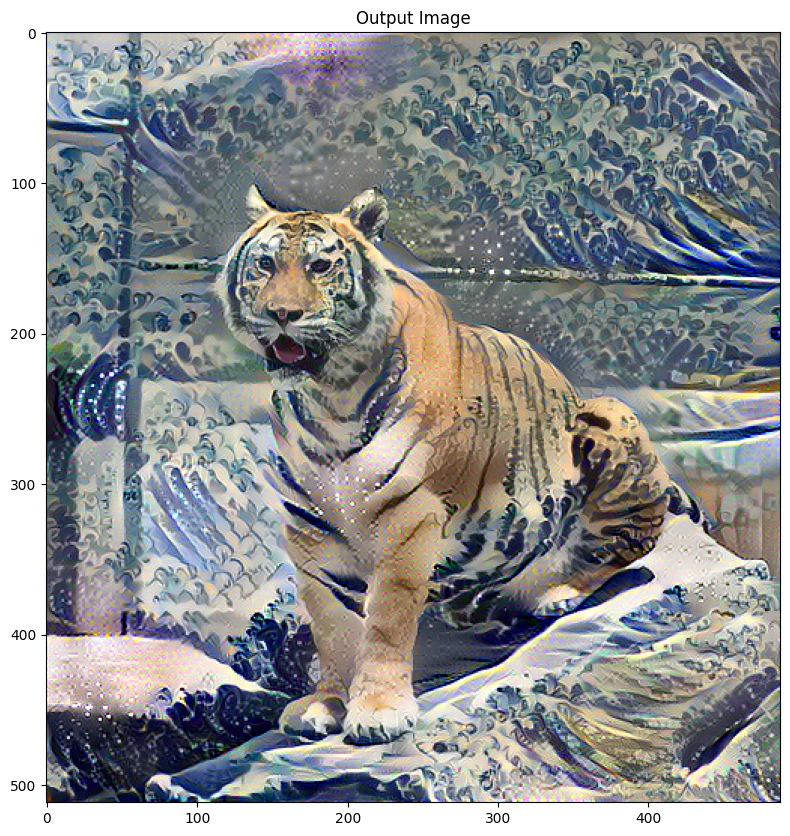

In [22]:
show_results(best, content_path, style_path)

## Try it on other images


### Starry night + Tuebingen


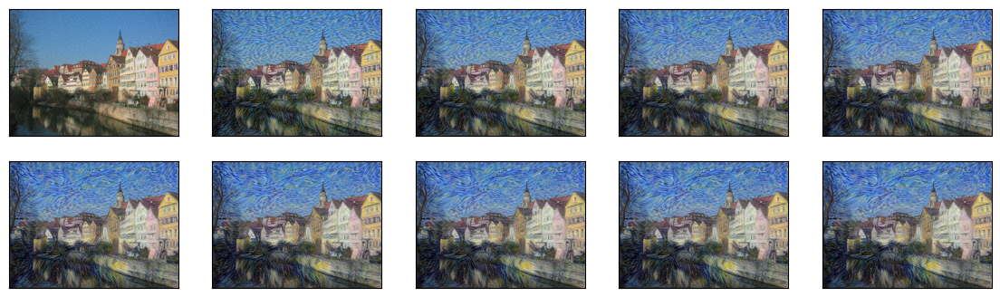

In [23]:
best_starry_night, best_loss = run_style_transfer(
    f"{img_dir}/Tuebingen_Neckarfront.jpg",
    f"{img_dir}/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg",
)

<ipython-input-5-efe26995a723>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


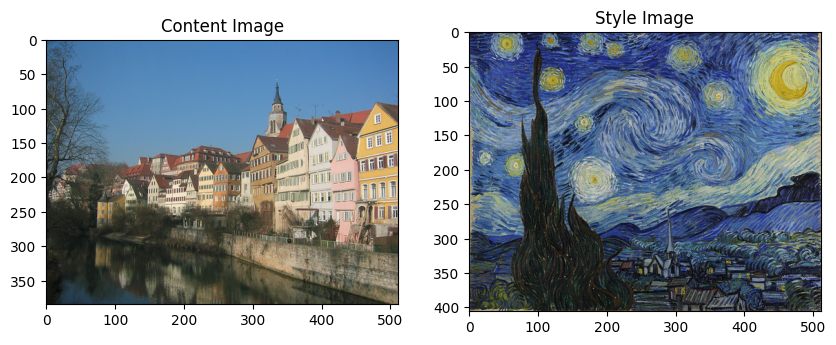

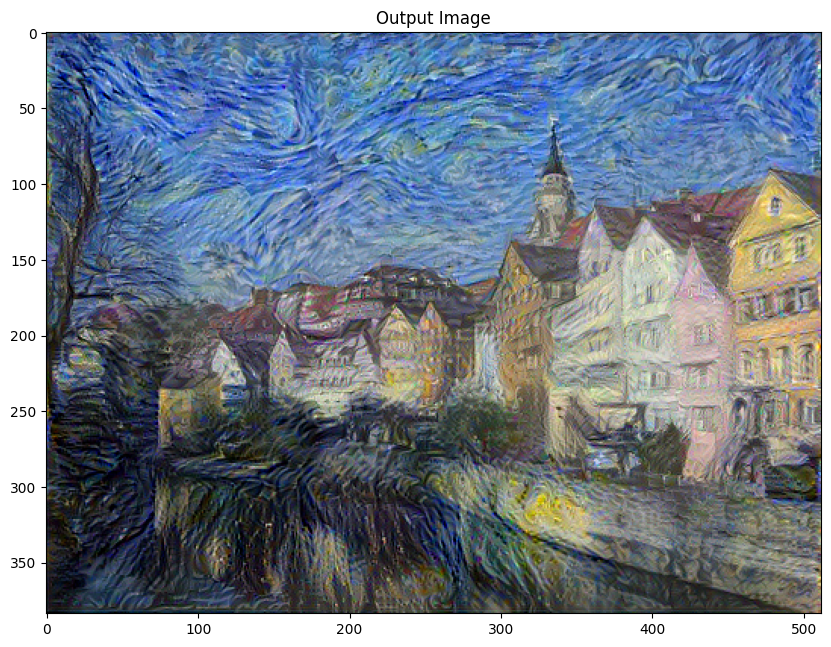

In [24]:
show_results(
    best_starry_night,
    f"{img_dir}/Tuebingen_Neckarfront.jpg",
    f"{img_dir}/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg",
)

### Pillars of Creation + Tuebingen


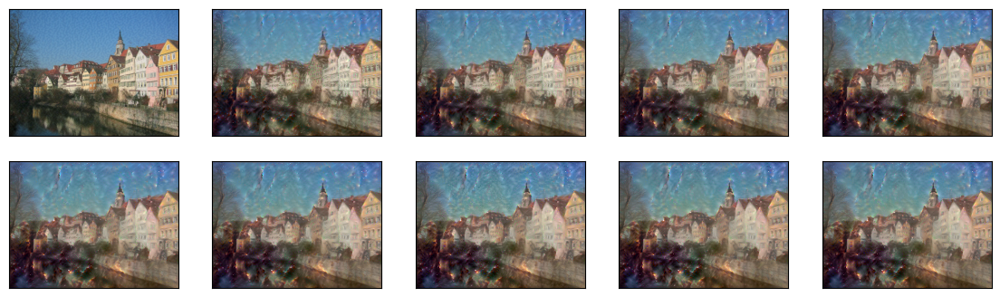

In [25]:
best_poc_tubingen, best_loss = run_style_transfer(
    f"{img_dir}/Tuebingen_Neckarfront.jpg",
    f"{img_dir}/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg",
)

<ipython-input-5-efe26995a723>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


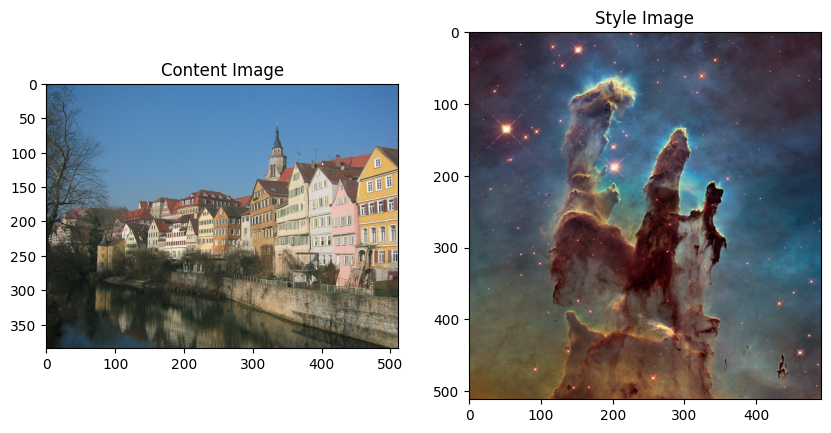

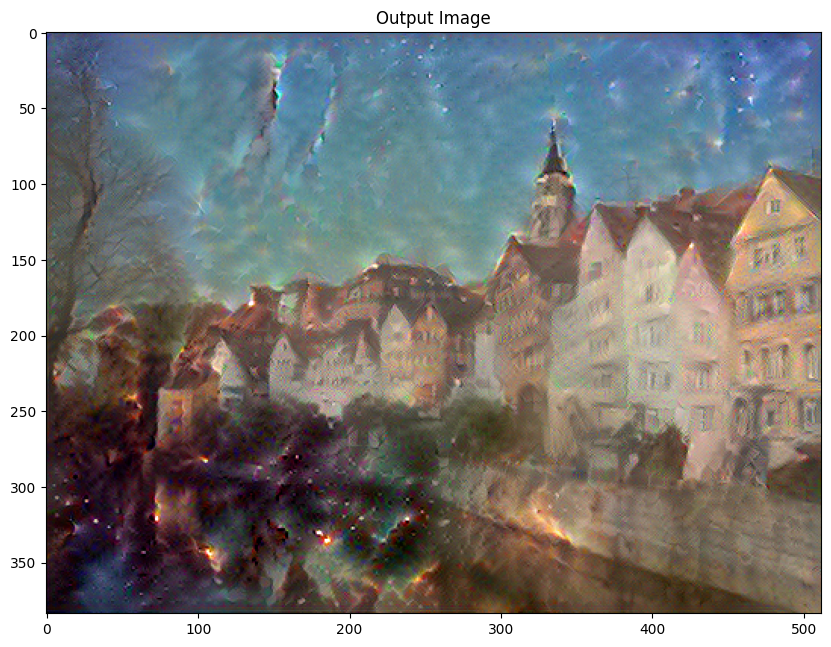

In [26]:
show_results(
    best_poc_tubingen,
    f"{img_dir}/Tuebingen_Neckarfront.jpg",
    f"{img_dir}/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg",
)

### Ooty + Tuebingen


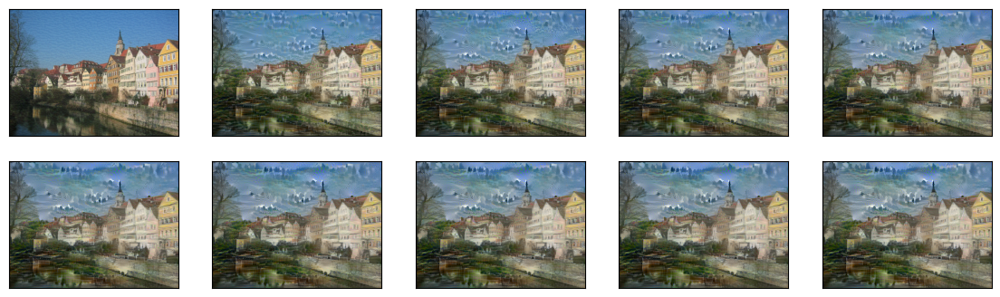

In [27]:
best_kandinsky_tubingen, best_loss = run_style_transfer(
    f"{img_dir}/Tuebingen_Neckarfront.jpg", f"{img_dir}/Ooty_lake_2.jpg"
)

<ipython-input-5-efe26995a723>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


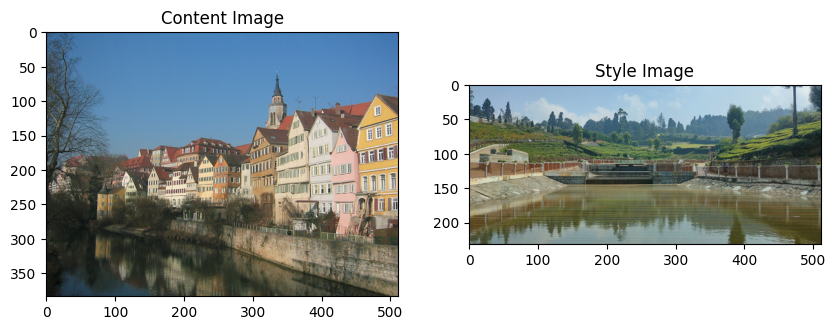

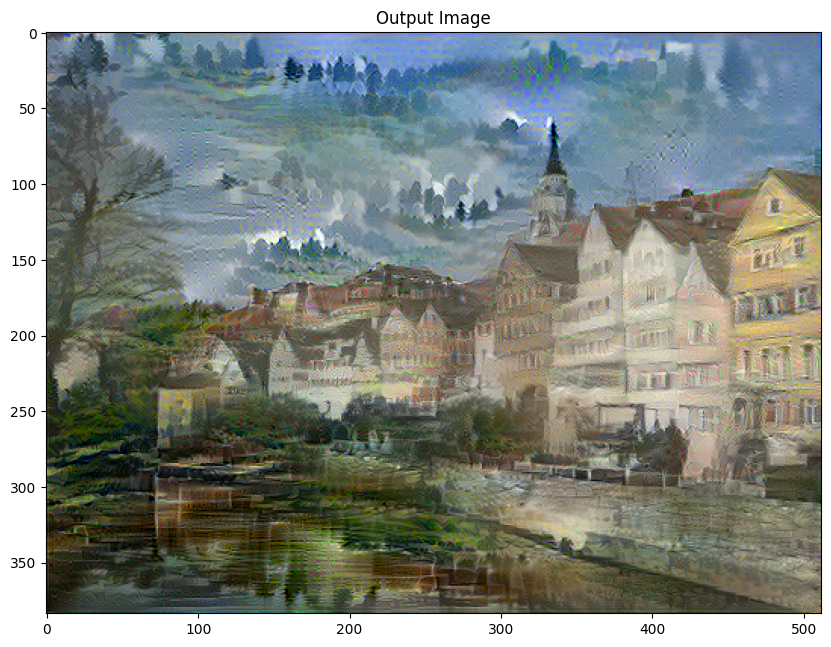

In [28]:
show_results(
    best_kandinsky_tubingen,
    f"{img_dir}/Tuebingen_Neckarfront.jpg",
    f"{img_dir}/Ooty_lake_2.jpg",
)

### Pillars of Creation + Sea Turtle


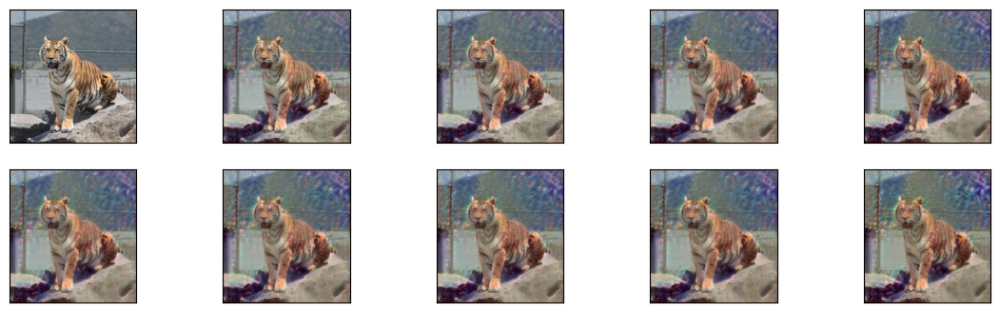

In [29]:
best_poc_turtle, best_loss = run_style_transfer(
    f"{img_dir}/Panthera_tigris_at_tuzoofari_mexico2018.jpg",
    f"{img_dir}/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg",
)

<ipython-input-5-efe26995a723>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


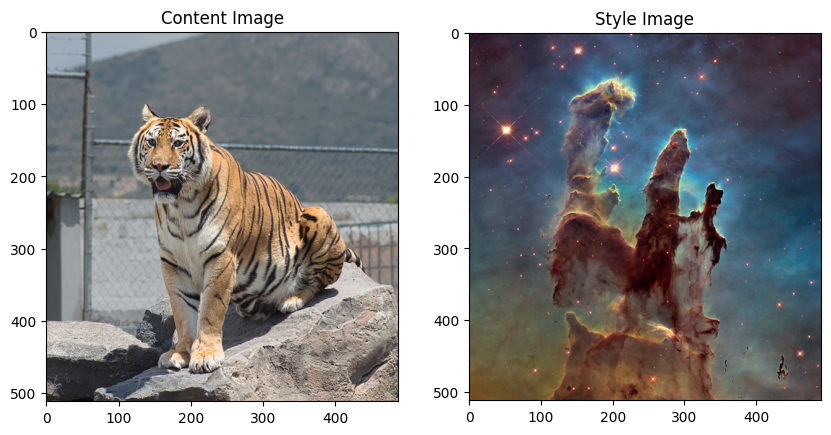

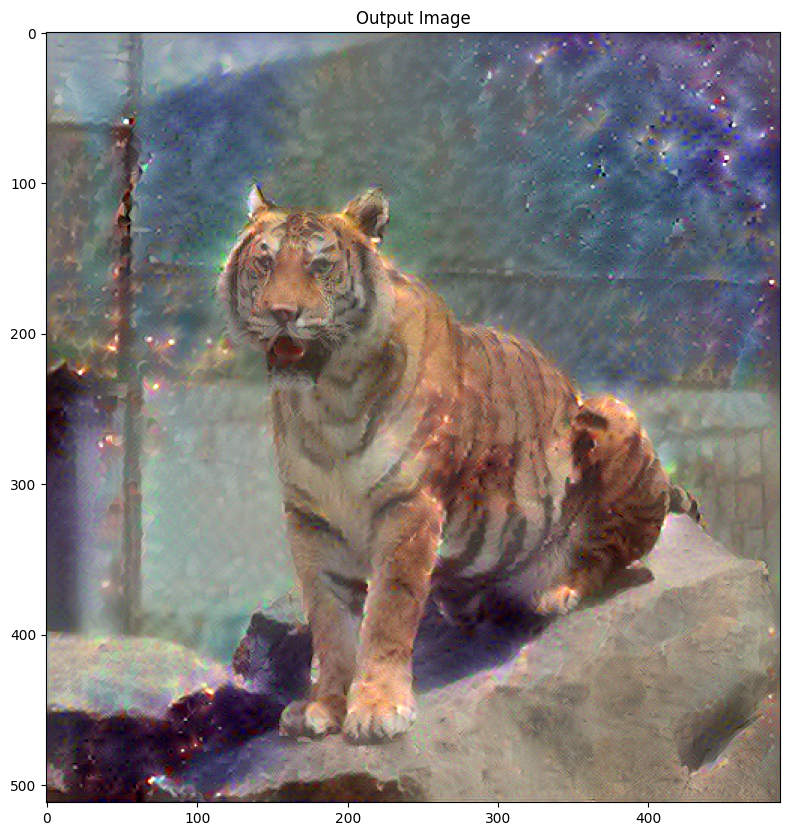

In [32]:
show_results(
    best_poc_turtle,
    f"{img_dir}/Panthera_tigris_at_tuzoofari_mexico2018.jpg",
    f"{img_dir}/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg",
)